Data : RCT

In [1]:
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from transformers import BertTokenizerFast, BertModel
import numpy as np
import pandas as pd
from tqdm import tqdm
import torch.nn.functional as F
import pickle


/hpc/home/zm91/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


balanced

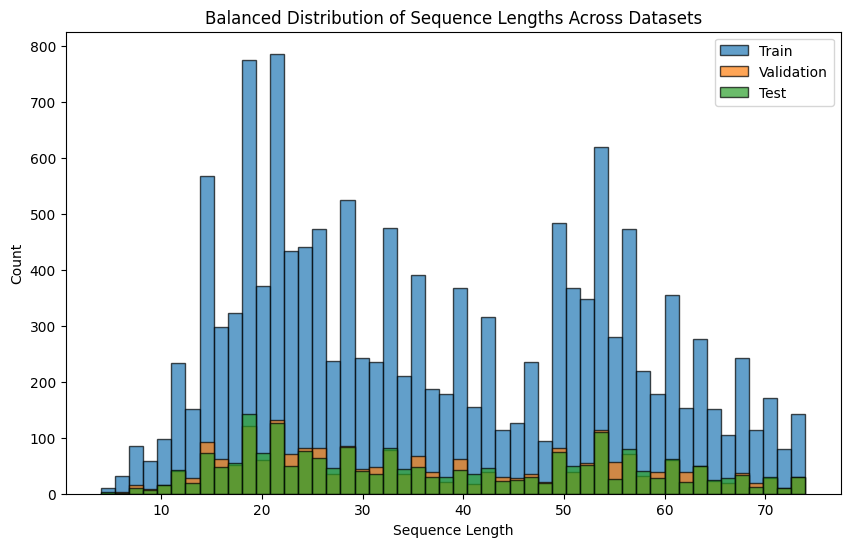

In [2]:
import requests
import matplotlib.pyplot as plt
import random
from transformers import BertTokenizerFast
np.random.seed(0)
truncations = [25, 50, 75]
train_url = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/train.txt?raw=true'
val_url = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/dev.txt?raw=true'
test_url = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/test.txt?raw=true'
sections = ['BACKGROUND', 'OBJECTIVE', 'METHODS', 'RESULTS', 'CONCLUSIONS']
section_to_idx = {s: i for i, s in enumerate(sections)}
def read_pubmed_rct(url):
    labels = []
    sentences = []
    with requests.get(url) as r:
        for line in r.iter_lines():
            fields = line.decode('utf-8').strip().split('\t')
            if len(fields) == 2:
                lbl, sent = fields[0], fields[1]
                if lbl in ["BACKGROUND", "OBJECTIVE"]:
                    labels.append(lbl)
                    sentences.append(sent)
    return sentences, labels
def process_and_balance_dataset(sentences, labels, truncations,seed=42):
    tokenizer = BertTokenizerFast.from_pretrained("bert-base-uncased")
    encodings = tokenizer(sentences, add_special_tokens=True, padding=False, truncation=False)
    lengths = [len(seq) for seq in encodings["input_ids"]]
    random.seed(seed)
    bins = [0] + truncations
    bin_indices = {i: [] for i in range(len(bins) - 1)}
    for i, seq_len in enumerate(lengths):
        for b in range(len(bins) - 1):
            low, high = bins[b], bins[b+1]
            if low <= seq_len < high:
                bin_indices[b].append(i)
                break
    min_count = min(len(idxs) for idxs in bin_indices.values() if len(idxs) > 0)
    sampled_indices = []
    for b, idxs in bin_indices.items():
        if len(idxs) >= min_count:
            sampled_indices.extend(random.sample(idxs, min_count))
        else:
            sampled_indices.extend(idxs)
    balanced_sentences = [sentences[i] for i in sampled_indices]
    balanced_labels = [labels[i] for i in sampled_indices]
    balanced_lengths = [lengths[i] for i in sampled_indices]
    return balanced_sentences, balanced_labels, balanced_lengths
s_train, y_train = read_pubmed_rct(train_url)
balanced_s_train, balanced_y_train, balanced_train_lengths = process_and_balance_dataset(s_train, y_train, truncations)
s_val, y_val = read_pubmed_rct(val_url)
balanced_s_val, balanced_y_val, balanced_val_lengths = process_and_balance_dataset(s_val, y_val, truncations)
s_test, y_test = read_pubmed_rct(test_url)
balanced_s_test, balanced_y_test, balanced_test_lengths = process_and_balance_dataset(s_test, y_test, truncations)
plt.figure(figsize=(10,6))
plt.hist(balanced_train_lengths, bins=50, edgecolor='black', alpha=0.7, label='Train')
plt.hist(balanced_val_lengths, bins=50, edgecolor='black', alpha=0.7, label='Validation')
plt.hist(balanced_test_lengths, bins=50, edgecolor='black', alpha=0.7, label='Test')
plt.title('Balanced Distribution of Sequence Lengths Across Datasets')
plt.xlabel('Sequence Length')
plt.ylabel('Count')
plt.legend()
plt.show()


truncations

原始训练集样本数：35566
原始验证集样本数：5825
原始测试集样本数：5954


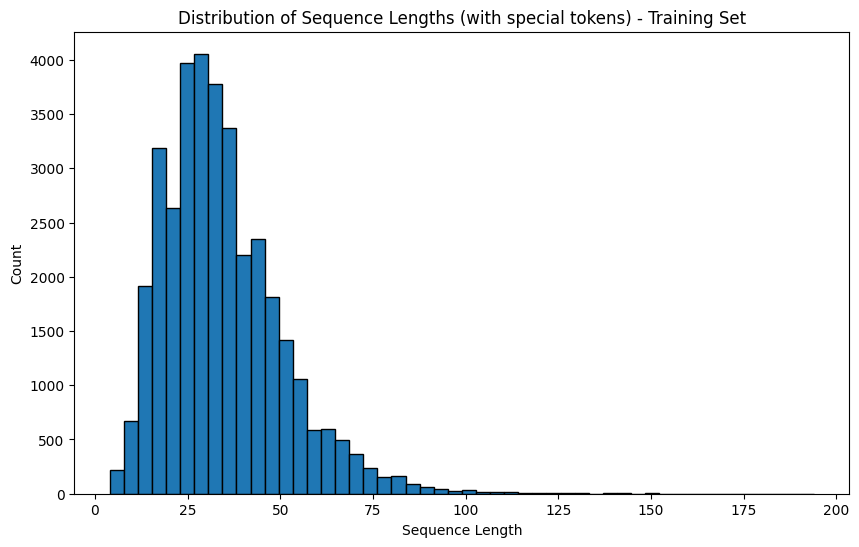

最常见的序列长度为：27 (出现 1057 次)
选择的筛选窗口为：[20, 34] tokens (delta = 7), 保留数据比例: 40.58%
训练集：筛选并增强后的样本数 = 14440
验证集：筛选并增强后的样本数 = 2382
测试集：筛选并增强后的样本数 = 2437

训练集 样本总数: 14440
BACKGROUND: 8960 (62.05%)
OBJECTIVE: 5480 (37.95%)

验证集 样本总数: 2382
BACKGROUND: 1424 (59.78%)
OBJECTIVE: 958 (40.22%)

测试集 样本总数: 2437
BACKGROUND: 1491 (61.18%)
OBJECTIVE: 946 (38.82%)

样本 1:
原标签: BACKGROUND
截断级别: 0.2
增强后的句子: yet, empirical evidence for individual

样本 2:
原标签: BACKGROUND
截断级别: 0.6
增强后的句子: / www. clinicaltrials. gov number nct00

样本 3:
原标签: BACKGROUND
截断级别: 0.4
增强后的句子: bohbot and o. tacca

样本 4:
原标签: BACKGROUND
截断级别: 0.2
增强后的句子: as presenters for laboratoire

样本 5:
原标签: OBJECTIVE
截断级别: 1
增强后的句子: Experimental studies have shown that EM reduce memory vividness and/or emotionality shortly after the intervention .


In [2]:
import requests
import matplotlib.pyplot as plt
import random
import numpy as np
from collections import Counter
from transformers import BertTokenizerFast
seed = 42
random.seed(seed)
np.random.seed(seed)
train_url = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/train.txt?raw=true'
val_url   = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/dev.txt?raw=true'
test_url  = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/test.txt?raw=true'
def read_pubmed_rct(url):
    labels = []
    sentences = []
    with requests.get(url) as r:
        for line in r.iter_lines():
            fields = line.decode('utf-8').strip().split('\t')
            if len(fields) == 2:
                lbl, sent = fields[0], fields[1]
                if lbl in ["BACKGROUND", "OBJECTIVE"]:
                    labels.append(lbl)
                    sentences.append(sent)
    return sentences, labels
s_train, y_train = read_pubmed_rct(train_url)
print('原始训练集样本数：%i' % len(s_train))
s_val, y_val = read_pubmed_rct(val_url)
print('原始验证集样本数：%i' % len(s_val))
s_test, y_test = read_pubmed_rct(test_url)
print('原始测试集样本数：%i' % len(s_test))
tokenizer = BertTokenizerFast.from_pretrained("bert-base-uncased")
encodings_train = tokenizer(s_train, add_special_tokens=True, padding=False, truncation=False)
train_lengths = [len(seq) for seq in encodings_train["input_ids"]]
plt.figure(figsize=(10,6))
plt.hist(train_lengths, bins=50, edgecolor='black')
plt.title('Distribution of Sequence Lengths (with special tokens) - Training Set')
plt.xlabel('Sequence Length')
plt.ylabel('Count')
plt.show()
length_counter = Counter(train_lengths)
most_common_length, count = length_counter.most_common(1)[0]
print(f"最常见的序列长度为：{most_common_length} (出现 {count} 次)")
desired_fraction = 0.4
delta = 0
total_samples = len(train_lengths)
while True:
    lower_bound_candidate = most_common_length - delta
    upper_bound_candidate = most_common_length + delta
    count_in_window = sum(1 for l in train_lengths if lower_bound_candidate <= l <= upper_bound_candidate)
    fraction = count_in_window / total_samples
    if fraction >= desired_fraction:
        break
    delta += 1
target_lower = most_common_length - delta
target_upper = most_common_length + delta
trunc_levels = [0.2, 0.4, 0.6, 0.8,1]
def augment_sentence(sentence, tokenizer, levels):
    tokens = tokenizer.tokenize(sentence)
    L = len(tokens)
    if L == 0:
        return sentence, None
    level = random.choice(levels)
    window_length = max(1, int(round(level * L)))
    if window_length >= L:
        return sentence, level
    start_idx = random.randint(0, L - window_length)
    truncated_tokens = tokens[start_idx:start_idx + window_length]
    augmented_sentence = tokenizer.convert_tokens_to_string(truncated_tokens)
    return augmented_sentence, level
def filter_and_augment(sentences, labels, tokenizer, lower_bound, upper_bound, levels):
    augmented_sentences = []
    augmented_labels = []
    truncation_levels_record = []
    for sent, lbl in zip(sentences, labels):
        tokens = tokenizer.tokenize(sent)
        L = len(tokens)
        if lower_bound <= L <= upper_bound:
            aug_sent, level = augment_sentence(sent, tokenizer, levels)
            augmented_sentences.append(aug_sent)
            augmented_labels.append(lbl)
            truncation_levels_record.append(level)
    return augmented_sentences, augmented_labels, truncation_levels_record
s_train_aug, y_train_aug, train_trunc_levels = filter_and_augment(
    s_train, y_train, tokenizer, target_lower, target_upper, trunc_levels)
s_val_aug, y_val_aug, val_trunc_levels = filter_and_augment(
    s_val, y_val, tokenizer, target_lower, target_upper, trunc_levels)
s_test_aug, y_test_aug, test_trunc_levels = filter_and_augment(
    s_test, y_test, tokenizer, target_lower, target_upper, trunc_levels)
print("训练集：筛选并增强后的样本数 =", len(s_train_aug))
print("验证集：筛选并增强后的样本数 =", len(s_val_aug))
print("测试集：筛选并增强后的样本数 =", len(s_test_aug))
def print_label_ratio(labels, dataset_name):
    counter = Counter(labels)
    total = sum(counter.values())
    print(f"\n{dataset_name} 样本总数: {total}")
    for label, count in counter.items():
        print(f"{label}: {count} ({count/total:.2%})")
print_label_ratio(y_train_aug, "训练集")
print_label_ratio(y_val_aug, "验证集")
print_label_ratio(y_test_aug, "测试集")
for i in range(min(5, len(s_train_aug))):
    print(f"\n样本 {i+1}:")
    print("原标签:", y_train_aug[i])
    print("截断级别:", train_trunc_levels[i])
    print("增强后的句子:", s_train_aug[i])


In [3]:
for i in range(min(5, len(s_train_aug))):
    print(f"\n样本 {i+1}:")
    print("原标签:", y_val_aug[i])
    print("截断级别:", val_trunc_levels[i])
    print("增强后的句子:", s_train_aug[i])



样本 1:
原标签: BACKGROUND
截断级别: 0.4
增强后的句子: yet, empirical evidence for individual

样本 2:
原标签: BACKGROUND
截断级别: 0.6
增强后的句子: / www. clinicaltrials. gov number nct00

样本 3:
原标签: OBJECTIVE
截断级别: 0.8
增强后的句子: bohbot and o. tacca

样本 4:
原标签: BACKGROUND
截断级别: 0.2
增强后的句子: as presenters for laboratoire

样本 5:
原标签: BACKGROUND
截断级别: 0.6
增强后的句子: Experimental studies have shown that EM reduce memory vividness and/or emotionality shortly after the intervention .


RAW

There are 35566 sentences in the filtered training set


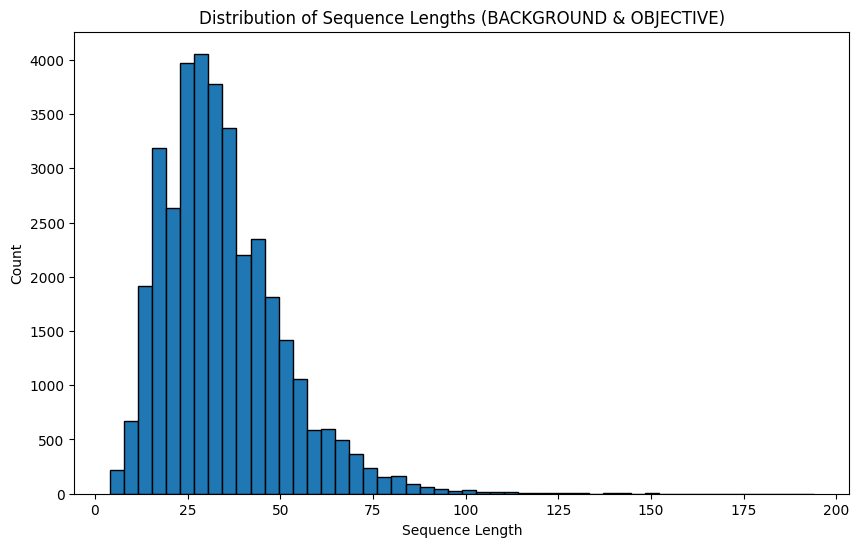

There are 5825 sentences in the filtered validation set


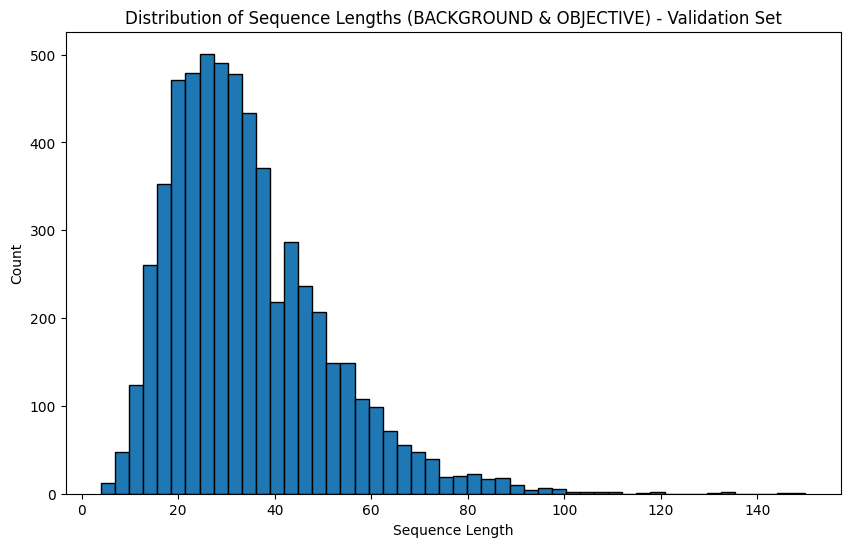

In [4]:
import requests
import matplotlib.pyplot as plt
from transformers import BertTokenizerFast
train_url = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/train.txt?raw=true'
val_url = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/dev.txt?raw=true'
test_url = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/test.txt?raw=true'
sections = ['BACKGROUND', 'OBJECTIVE', 'METHODS', 'RESULTS', 'CONCLUSIONS']
section_to_idx = {s: i for i, s in enumerate(sections)}
def read_pubmed_rct(url):
    labels = []
    sentences = []
    with requests.get(url) as r:
        for line in r.iter_lines():
            fields = line.decode('utf-8').strip().split('\t')
            if len(fields) == 2:
                lbl, sent = fields[0], fields[1]
                if lbl in ["BACKGROUND", "OBJECTIVE"]:
                    labels.append(lbl)
                    sentences.append(sent)
    return sentences, labels
s_train, y_train = read_pubmed_rct(train_url)
print('There are %i sentences in the filtered training set' % len(s_train))
tokenizer = BertTokenizerFast.from_pretrained("bert-base-uncased")
encodings = tokenizer(s_train, add_special_tokens=True, padding=False, truncation=False)
lengths = [len(seq) for seq in encodings["input_ids"]]
plt.figure(figsize=(10,6))
plt.hist(lengths, bins=50, edgecolor='black')
plt.title('Distribution of Sequence Lengths (BACKGROUND & OBJECTIVE)')
plt.xlabel('Sequence Length')
plt.ylabel('Count')
plt.show()
s_val, y_val = read_pubmed_rct(val_url)
print('There are %i sentences in the filtered validation set' % len(s_val))
val_encodings = tokenizer(s_val, add_special_tokens=True, padding=False, truncation=False)
val_lengths = [len(seq) for seq in val_encodings["input_ids"]]
plt.figure(figsize=(10,6))
plt.hist(val_lengths, bins=50, edgecolor='black')
plt.title('Distribution of Sequence Lengths (BACKGROUND & OBJECTIVE) - Validation Set')
plt.xlabel('Sequence Length')
plt.ylabel('Count')
plt.show()


In [3]:
counts = [
    np.sum(y_val_int == label_map['BACKGROUND']),
    np.sum(y_val_int == label_map['OBJECTIVE'])
]
labels = ['BACKGROUND', 'OBJECTIVE']
colors = ['
plt.pie(
    counts,
    labels=labels,
    autopct='%1.1f%%',
    startangle=140,
    colors=colors,
    explode=(0.05, 0.05),
    shadow=True
)
plt.title('Proportion of Positive and Negative Samples')
plt.axis('equal')
plt.show()


NameError: name 'y_val_int' is not defined

early stop

In [5]:
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0.0, verbose=False, save_path=None):
        self.patience = patience
        self.min_delta = min_delta
        self.verbose = verbose
        self.counter = 0
        self.best_loss = np.inf
        self.early_stop = False
        self.save_path = save_path
    def __call__(self, val_loss, model=None):
        if val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
            if self.save_path and model is not None:
                torch.save(model.state_dict(), self.save_path)
        else:
            self.counter += 1
            if self.verbose:
                print(f"EarlyStopping counter: {self.counter} out of {self.patience}")
            if self.counter >= self.patience:
                self.early_stop = True


Pooling

In [6]:
def pool_embeddings(embeddings, attention_mask, strategy="cls"):
    if strategy == "cls":
        return embeddings[:, 0, :]
    elif strategy == "mean_with_padding":
        return embeddings.mean(dim=1)
    elif strategy == "mean_without_padding":
        mask = attention_mask.unsqueeze(-1)
        sum_embeddings = (embeddings * mask).sum(dim=1)
        valid_token_count = mask.sum(dim=1)
        return sum_embeddings / valid_token_count
    else:
        raise ValueError("Invalid pooling strategy")


train and predict

In [7]:
def evaluate_model(model, data_loader, criterion, device):
    model.eval()
    total_loss = 0.0
    total_count = 0
    with torch.no_grad():
        for batch in data_loader:
            batch = [b.to(device) for b in batch]
            input_ids, attention_mask, labels = batch
            outputs = model(input_ids, attention_mask=attention_mask)
            loss = criterion(outputs, labels)
            total_loss += loss.item() * input_ids.size(0)
            total_count += input_ids.size(0)
    return total_loss / total_count
def train_predict(model, train_loader, val_loader, criterion, optimizer, epochs, scheduler=None, early_stopping=None, device='cpu'):
    model.to(device)
    for epoch in range(epochs):
        model.train()
        total_train_loss = 0.0
        total_train_count = 0
        for batch in train_loader:
            batch = [b.to(device) for b in batch]
            input_ids, attention_mask, labels = batch
            optimizer.zero_grad()
            outputs = model(input_ids, attention_mask=attention_mask)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item() * input_ids.size(0)
            total_train_count += input_ids.size(0)
        train_loss = total_train_loss / total_train_count
        val_loss = evaluate_model(model, val_loader, criterion, device)
        if scheduler is not None:
            scheduler.step(val_loss)
        print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
        if early_stopping is not None:
            early_stopping(val_loss, model=model)
            if early_stopping.early_stop:
                print("Early stopping triggered.")
                break
    return model


pooling

In [8]:
class FullModel(nn.Module):
    def __init__(self, base_model, swe_pooling, classifier, pooling_strategy="swe"):
        super(FullModel, self).__init__()
        self.base_model = base_model
        self.swe_pooling = swe_pooling
        self.classifier = classifier
        self.strategy = pooling_strategy
    def forward(self, input_ids, attention_mask):
        outputs = self.base_model(input_ids=input_ids, attention_mask=attention_mask)
        embeddings = outputs.last_hidden_state
        if self.strategy == "swe":
            sentence_embeddings = self.swe_pooling(embeddings, mask=attention_mask)
        else:
            sentence_embeddings = pool_embeddings(embeddings, attention_mask, strategy=self.strategy)
        logits = self.classifier(sentence_embeddings)
        return logits


ensemble

In [9]:
def run_ensemble_training(s_train, y_train, s_val, y_val,
                          pooling='swe', heads=None, layers=None,
                          embedding_size=768, dim_feedforward=2048,
                          epochs=5, learning_rate=2e-5, n_trainings=3,
                          batch_size=32, max_length=100,
                          early_stopping_patience=3,
                          device=None):
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    tokenizer = BertTokenizerFast.from_pretrained("bert-base-uncased")
    label_map = {"BACKGROUND": 0, "OBJECTIVE": 1}
    y_train_int = [label_map[lbl] for lbl in y_train]
    y_val_int = [label_map[lbl] for lbl in y_val]
    y_train_tensor = torch.tensor(y_train_int, dtype=torch.long)
    y_val_tensor = torch.tensor(y_val_int, dtype=torch.long)
    train_encodings = tokenizer(s_train, add_special_tokens=True, padding=True, truncation=True, max_length=max_length, return_tensors="pt")
    val_encodings = tokenizer(s_val, add_special_tokens=True, padding=True, truncation=True, max_length=max_length, return_tensors="pt")
    train_dataset = TensorDataset(train_encodings["input_ids"], train_encodings["attention_mask"], y_train_tensor)
    val_dataset = TensorDataset(val_encodings["input_ids"], val_encodings["attention_mask"], y_val_tensor)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    num_labels = 2
    num_slices = 768
    num_ref_points = 10
    n_samples = len(y_val)
    predictions_df = pd.DataFrame(index=range(n_samples), columns=range(n_trainings))
    print(f"\nTraining {n_trainings} models for ensemble to quantify uncertainty.")
    for i in tqdm(range(n_trainings), desc=f"Ensemble training"):
        base_model = BertModel.from_pretrained("bert-base-uncased").to(device)
        for name, param in base_model.named_parameters():
            param.requires_grad = False
        base_model.train()
        swe_pooling_layer = SWE_Pooling(d_in=base_model.config.hidden_size, num_slices=num_slices, num_ref_points=num_ref_points, freeze_swe=False).to(device)
        pooling_strategy = pooling
        if pooling_strategy == "swe":
            classifier = nn.Linear(num_slices, num_labels).to(device)
        else:
            classifier = nn.Linear(base_model.config.hidden_size, num_labels).to(device)
        if pooling_strategy == "swe":
            optimizer = torch.optim.Adam(
                list(swe_pooling_layer.parameters()) + list(classifier.parameters()),
                lr=learning_rate
            )
        else:
            optimizer = torch.optim.Adam(
                list(classifier.parameters()),
                lr=learning_rate
            )
        criterion = nn.CrossEntropyLoss()
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, factor=0.1)
        early_stopping = EarlyStopping(patience=early_stopping_patience, min_delta=0.01)
        full_model = FullModel(base_model, swe_pooling_layer, classifier, pooling_strategy).to(device)
        trained_model = train_predict(
            model=full_model,
            train_loader=train_loader,
            val_loader=val_loader,
            criterion=criterion,
            optimizer=optimizer,
            epochs=epochs,
            scheduler=scheduler,
            early_stopping=early_stopping,
            device=device
        )
        all_probs = []
        trained_model.eval()
        with torch.no_grad():
            for batch in val_loader:
                input_ids, attention_mask, labels = [b.to(device) for b in batch]
                outputs = trained_model(input_ids, attention_mask=attention_mask)
                probs = F.softmax(outputs, dim=1)
                all_probs.append(probs.cpu().numpy())
        probabilities = np.concatenate(all_probs)
        predictions_df[i] = probabilities[:, 1]
        print(predictions_df)
    print(f"Shape of predictions_df: {predictions_df.shape}")
    print(f"Sample predictions:\n{predictions_df.head()}")
    if not predictions_df.empty:
        model_dir = f'model'
        os.makedirs(model_dir, exist_ok=True)
        predictions_path = os.path.join(model_dir, f'ntrain_{pooling}_sq{max_length}_rct_bal.pkl')
        with open(predictions_path, 'wb') as f:
            pickle.dump(predictions_df, f)
        print(f"Predictions saved to {predictions_path}")
    else:
        print("Warning: predictions_df is empty. File not saved.")
    return predictions_df


In [10]:
truncation=[target_upper]
pooling=['cls',
         'mean_without_padding']


In [11]:
for max_l in truncation:
    for pool in pooling:
        predictions = run_ensemble_training(
            s_train=s_train_aug,
            y_train=y_train_aug,
            s_val=s_val_aug,
            y_val=y_val_aug,
            pooling=pool,
            embedding_size=768,
            dim_feedforward=1024,
            epochs=50,
            learning_rate=1e-3,
            n_trainings=10,
            batch_size=2048,
            max_length=max_l,
            early_stopping_patience=5
        )



Training 10 models for ensemble to quantify uncertainty.


Ensemble training:   0%|          | 0/10 [00:05<?, ?it/s]


NameError: name 'SWE_Pooling' is not defined

swe pooling

In [7]:
from types import SimpleNamespace
import os
import pickle as pk
from functools import lru_cache
import torch
import torch.nn as nn
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
import sys
sys.path.append("..")
import contextlib
class Cosine(nn.Module):
    def forward(self, x1, x2):
        return nn.CosineSimilarity()(x1, x2)
class SquaredCosine(nn.Module):
    def forward(self, x1, x2):
        return nn.CosineSimilarity()(x1, x2) ** 2
class Euclidean(nn.Module):
    def forward(self, x1, x2):
        return torch.cdist(x1, x2, p=2.0)
class SquaredEuclidean(nn.Module):
    def forward(self, x1, x2):
        return torch.cdist(x1, x2, p=2.0) ** 2
DISTANCE_METRICS = {
    "Cosine": Cosine,
    "SquaredCosine": SquaredCosine,
    "Euclidean": Euclidean,
    "SquaredEuclidean": SquaredEuclidean,
}
ACTIVATIONS = {"ReLU": nn.ReLU, "GELU": nn.GELU, "ELU": nn.ELU, "Sigmoid": nn.Sigmoid}
class LogisticActivation(nn.Module):
    def __init__(self, x0=0, k=1, train=False):
        super(LogisticActivation, self).__init__()
        self.x0 = x0
        self.k = nn.Parameter(torch.FloatTensor([float(k)]), requires_grad=False)
        self.k.requiresGrad = train
    def forward(self, x):
        o = torch.clamp(
            1 / (1 + torch.exp(-self.k * (x - self.x0))), min=0, max=1
        ).squeeze()
        return o
    def clip(self):
        self.k.data.clamp_(min=0)
class Interp1d(torch.autograd.Function):
    def __call__(self, x, y, xnew, out=None):
        return self.forward(x, y, xnew, out)
    def forward(ctx, x, y, xnew, out=None):
        is_flat = {}
        require_grad = {}
        v = {}
        device = []
        eps = torch.finfo(y.dtype).eps
        for name, vec in {'x': x, 'y': y, 'xnew': xnew}.items():
            assert len(vec.shape) <= 2, 'interp1d: all inputs must be '\
                                        'at most 2-D.'
            if len(vec.shape) == 1:
                v[name] = vec[None, :]
            else:
                v[name] = vec
            is_flat[name] = v[name].shape[0] == 1
            require_grad[name] = vec.requires_grad
            device = list(set(device + [str(vec.device)]))
        assert len(device) == 1, 'All parameters must be on the same device.'
        device = device[0]
        assert (v['x'].shape[1] == v['y'].shape[1]
                and (
                     v['x'].shape[0] == v['y'].shape[0]
                     or v['x'].shape[0] == 1
                     or v['y'].shape[0] == 1
                    )
                ), ("x and y must have the same number of columns, and either "
                    "the same number of row or one of them having only one "
                    "row.")
        reshaped_xnew = False
        if ((v['x'].shape[0] == 1) and (v['y'].shape[0] == 1)
           and (v['xnew'].shape[0] > 1)):
            original_xnew_shape = v['xnew'].shape
            v['xnew'] = v['xnew'].contiguous().view(1, -1)
            reshaped_xnew = True
        D = max(v['x'].shape[0], v['xnew'].shape[0])
        shape_ynew = (D, v['xnew'].shape[-1])
        if out is not None:
            if out.numel() != shape_ynew[0]*shape_ynew[1]:
                out = None
            else:
                ynew = out.reshape(shape_ynew)
        if out is None:
            ynew = torch.zeros(*shape_ynew, device=device)
        for name in v:
            v[name] = v[name].to(device)
        ind = ynew.long()
        if v['xnew'].shape[0] == 1:
            v['xnew'] = v['xnew'].expand(v['x'].shape[0], -1)
        torch.searchsorted(v['x'].contiguous(),
                           v['xnew'].contiguous(), out=ind)
        ind -= 1
        ind = torch.clamp(ind, 0, v['x'].shape[1] - 1 - 1)
        def sel(name):
            if is_flat[name]:
                return v[name].contiguous().view(-1)[ind]
            return torch.gather(v[name], 1, ind)
        enable_grad = False
        saved_inputs = []
        for name in ['x', 'y', 'xnew']:
            if require_grad[name]:
                enable_grad = True
                saved_inputs += [v[name]]
            else:
                saved_inputs += [None, ]
        is_flat['slopes'] = is_flat['x']
        with torch.enable_grad() if enable_grad else contextlib.suppress():
            v['slopes'] = (
                    (v['y'][:, 1:]-v['y'][:, :-1])
                    /
                    (eps + (v['x'][:, 1:]-v['x'][:, :-1]))
                )
            ynew = sel('y') + sel('slopes')*(
                                    v['xnew'] - sel('x'))
            if reshaped_xnew:
                ynew = ynew.view(original_xnew_shape)
        ctx.save_for_backward(ynew, *saved_inputs)
        return ynew
    @staticmethod
    def backward(ctx, grad_out):
        inputs = ctx.saved_tensors[1:]
        gradients = torch.autograd.grad(
                        ctx.saved_tensors[0],
                        [i for i in inputs if i is not None],
                        grad_out, retain_graph=True)
        result = [None, ] * 5
        pos = 0
        for index in range(len(inputs)):
            if inputs[index] is not None:
                result[index] = gradients[pos]
                pos += 1
        return (*result,)
class SWE_Pooling(nn.Module):
    def __init__(self, d_in, num_slices, num_ref_points, freeze_swe=False):
        super(SWE_Pooling, self).__init__()
        self.d_in = d_in
        self.num_ref_points = num_ref_points
        self.num_slices = num_slices
        uniform_ref = torch.linspace(-1, 1, num_ref_points).unsqueeze(1).repeat(1, num_slices)
        self.reference = nn.Parameter(uniform_ref)
        self.theta = nn.utils.weight_norm(nn.Linear(d_in, num_slices, bias=False), dim=0)
        self.theta.weight_g.data = torch.ones_like(self.theta.weight_g.data, requires_grad=False)
        self.theta.weight_g.requires_grad = False
        nn.init.normal_(self.theta.weight_v)
        if freeze_swe:
            self.theta.weight_v.requires_grad = False
            self.reference.requires_grad = False
        self.weight = nn.Linear(num_ref_points, 1, bias=False)
    def forward(self, X, mask=None):
        B, N, _ = X.shape
        Xslices = self.get_slice(X)
        M, _ = self.reference.shape
        if mask is None:
            Xslices_sorted, Xind = torch.sort(Xslices, dim=1)
            if M == N:
                Xslices_sorted_interpolated = Xslices_sorted
            else:
                x = torch.linspace(0, 1, N + 2)[1:-1].unsqueeze(0).repeat(B * self.num_slices, 1).to(X.device)
                xnew = torch.linspace(0, 1, M + 2)[1:-1].unsqueeze(0).repeat(B * self.num_slices, 1).to(X.device)
                y = torch.transpose(Xslices_sorted, 1, 2).reshape(B * self.num_slices, -1)
                Xslices_sorted_interpolated = torch.transpose(Interp1d()(x, y, xnew).view(B, self.num_slices, -1), 1, 2)
        else:
            invalid_elements_mask = ~mask.bool().unsqueeze(-1).repeat(1, 1, self.num_slices)
            Xslices_copy = Xslices.clone()
            Xslices_copy[invalid_elements_mask] = -1e10
            top2_Xslices, _ = torch.topk(Xslices_copy, k=2, dim=1)
            max_Xslices = top2_Xslices[:, 0].unsqueeze(1)
            delta_y = - torch.diff(top2_Xslices, dim=1)
            Xslices_modified = Xslices.clone()
            Xslices_modified[invalid_elements_mask] = max_Xslices.repeat(1, N, 1)[invalid_elements_mask]
            delta_x = 1 / (1 + torch.sum(mask, dim=1, keepdim=True))
            slope = delta_y / delta_x.unsqueeze(-1).repeat(1, 1, self.num_slices)
            slope = slope.repeat(1, N, 1)
            eps = 1e-3
            x_shifts = eps * torch.cumsum(invalid_elements_mask, dim=1)
            y_shifts = slope * x_shifts
            Xslices_modified = Xslices_modified + y_shifts
            Xslices_sorted, _ = torch.sort(Xslices_modified, dim=1)
            x = torch.arange(1, N + 1).to(X.device) / (1 + torch.sum(mask, dim=1, keepdim=True))
            invalid_elements_mask = ~mask.bool()
            x_copy = x.clone()
            x_copy[invalid_elements_mask] = -1e10
            max_x, _ = torch.max(x_copy, dim=1, keepdim=True)
            x[invalid_elements_mask] = max_x.repeat(1, N)[invalid_elements_mask]
            x = x.unsqueeze(1).repeat(1, self.num_slices, 1) + torch.transpose(x_shifts, 1, 2)
            x = x.view(-1, N)
            xnew = torch.linspace(0, 1, M + 2)[1:-1].unsqueeze(0).repeat(B * self.num_slices, 1).to(X.device)
            y = torch.transpose(Xslices_sorted, 1, 2).reshape(B * self.num_slices, -1)
            Xslices_sorted_interpolated = torch.transpose(Interp1d()(x, y, xnew).view(B, self.num_slices, -1), 1, 2)
        Rslices = self.reference.expand(Xslices_sorted_interpolated.shape)
        _, Rind = torch.sort(Rslices, dim=1)
        embeddings = (Rslices - torch.gather(Xslices_sorted_interpolated, dim=1, index=Rind)).permute(0, 2, 1)
        weighted_embeddings = self.weight(embeddings).sum(-1)
        return weighted_embeddings.view(-1, self.num_slices)
    def get_slice(self, X):
        return self.theta(X)


In [17]:
poolings = ["cls", "mean_without_padding"]
truncations = [
               "100"]
seq_l=target_upper
res_set = []
for pooling in poolings:
    try:
        with open(f'model/ntrain_{pooling}_sq{seq_l}_rct_bal.pkl', 'rb') as f:
            sub_res = pickle.load(f)
    except FileNotFoundError:
        print(f"File model/ntrain_{pooling}_sq{seq_l}.pkl not found. Skipping.")
        continue
    res_set.append(sub_res)


BAL

In [15]:
poolings = ["cls", "mean_without_padding"]
truncations = [
               "100"]
seq_l=75
res_set = []
for pooling in poolings:
    try:
        with open(f'model/ntrain_{pooling}_sq{seq_l}_rct_bal.pkl', 'rb') as f:
            sub_res = pickle.load(f)
    except FileNotFoundError:
        print(f"File model/ntrain_{pooling}_sq{seq_l}.pkl not found. Skipping.")
        continue
    res_set.append(sub_res)


ause

In [18]:
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.metrics import (roc_auc_score, roc_curve, precision_recall_curve, average_precision_score,
                             brier_score_loss)
from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt
import seaborn as sns
def compute_ece(y_true, y_prob, n_bins=10):
    y_true = np.array(y_true)
    y_prob = np.array(y_prob)
    bin_edges = np.linspace(0, 1, n_bins + 1)
    ece = 0.0
    for i in range(n_bins):
        bin_lower = bin_edges[i]
        bin_upper = bin_edges[i + 1]
        bin_mask = (y_prob > bin_lower) & (y_prob <= bin_upper)
        bin_count = np.sum(bin_mask)
        if bin_count > 0:
            bin_accuracy = np.mean(y_true[bin_mask] == 1)
            bin_confidence = np.mean(y_prob[bin_mask])
            ece += np.abs(bin_accuracy - bin_confidence) * (bin_count / len(y_true))
    return ece
def uncertainty_auroc(y, predictions, variance):
    y = np.array(y)
    predictions = np.array(predictions)
    variance = np.array(variance)
    correctness = (y == (predictions > 0.5))
    fprs, tprs, _ = roc_curve(correctness, -1 * variance)
    auc = roc_auc_score(correctness, -1 * variance)
    return tprs, fprs, auc
def calculate_ause(uncertainty, predictions, targets, metric='brier',
                   uncertainty_type='variance', bins=10, save_path=None, min_fraction=0.0,
                   max_fraction=0.9, ax=None, color='b', label='Sparsification Error'):
    if not (len(predictions) == len(targets) == len(uncertainty)):
        raise ValueError("predictions, targets, and uncertainty must have the same length.")
    if len(predictions) < 10:
        raise ValueError("Not enough predictions for sparsification.")
    def brier_score(preds, tgts):
        return np.mean((preds - tgts)**2)
    def mean_absolute_error(preds, tgts):
        return np.mean(np.abs(preds - tgts))
    def calculate_ece_metric(preds, tgts, n_bins=10):
        n = len(preds)
        if n == 0:
            return np.nan
        bin_edges = np.linspace(0., 1., n_bins + 1)
        bin_indices = np.digitize(preds, bin_edges, right=True) - 1
        ece = 0.0
        for i in range(n_bins):
            bin_mask = bin_indices == i
            bin_size = np.sum(bin_mask)
            if bin_size > 0:
                bin_confidence = np.mean(preds[bin_mask])
                bin_accuracy = np.mean(tgts[bin_mask])
                ece += (bin_size / n) * np.abs(bin_accuracy - bin_confidence)
        return ece
    def calculate_auc_metric(preds, tgts):
        if len(np.unique(tgts)) < 2:
            return np.nan
        return roc_auc_score(tgts, preds)
    if metric == 'brier':
        error_function = brier_score
    elif metric == 'mae':
        error_function = mean_absolute_error
    elif metric == 'ece':
        error_function = lambda p, t: calculate_ece_metric(p, t, n_bins=bins)
    elif metric == 'auc':
        error_function = calculate_auc_metric
    else:
        raise ValueError("Unknown metric. Choose from 'brier', 'mae', 'ece', or 'auc'.")
    sorted_inds_uncertainty = np.argsort(uncertainty)
    if metric in ['brier', 'mae']:
        if metric == 'brier':
            true_errors = (predictions - targets)**2
        else:
            true_errors = np.abs(predictions - targets)
        sorted_inds_error = np.argsort(true_errors)
    else:
        sorted_inds_error = None
    uncertainty_scores = []
    oracle_scores = []
    fractions = np.linspace(min_fraction, max_fraction, int((max_fraction - min_fraction)/0.01) + 1)
    num_samples = len(predictions)
    for fraction in fractions:
        num_keep = max(1, int((1.0 - fraction) * num_samples))
        inds_keep_uncertainty = sorted_inds_uncertainty[:num_keep]
        remaining_preds = predictions[inds_keep_uncertainty]
        remaining_targets = targets[inds_keep_uncertainty]
        try:
            uncertainty_error_score = error_function(remaining_preds, remaining_targets)
        except ValueError as e:
            print(f"Error calculating {metric} at fraction {fraction:.2f}: {e}")
            uncertainty_error_score = np.nan
        uncertainty_scores.append(uncertainty_error_score)
        if sorted_inds_error is not None:
            inds_keep_oracle = sorted_inds_error[:num_keep]
            oracle_preds = predictions[inds_keep_oracle]
            oracle_targets = targets[inds_keep_oracle]
            try:
                oracle_error_score = error_function(oracle_preds, oracle_targets)
            except ValueError as e:
                print(f"Error calculating Oracle {metric} at fraction {fraction:.2f}: {e}")
                oracle_error_score = np.nan
            oracle_scores.append(oracle_error_score)
        else:
            oracle_scores.append(np.nan)
    uncertainty_scores = np.array(uncertainty_scores)
    oracle_scores = np.array(oracle_scores)
    if metric in ['brier', 'mae']:
        uncertainty_scores_normalized = uncertainty_scores / uncertainty_scores[0]
        if sorted_inds_error is not None:
            oracle_scores_normalized = oracle_scores / oracle_scores[0]
        else:
            oracle_scores_normalized = np.full_like(uncertainty_scores_normalized, np.nan)
    elif metric == 'ece':
        uncertainty_scores_normalized = uncertainty_scores / uncertainty_scores[0]
        oracle_scores_normalized = np.full_like(uncertainty_scores_normalized, np.nan)
    elif metric == 'auc':
        uncertainty_scores_normalized = (1 - uncertainty_scores) / (1 - uncertainty_scores[0])
        oracle_scores_normalized = np.full_like(uncertainty_scores_normalized, np.nan)
    else:
        raise ValueError("Unknown metric.")
    ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 6))
    if metric in ['brier', 'mae', 'ece', 'auc']:
        ax.plot(fractions, uncertainty_scores_normalized, label=f"{label} (AUSE={ause_pred:.4f})", color=color)
    ax.set_xlabel("Fraction of removed samples")
    ax.set_ylabel(f"{metric.upper()} Error (Normalized)")
    ax.set_ylim([0, 1.5])
    ax.set_title('Sparsification Curve')
    ax.legend()
    ax.grid(True)
    if save_path:
        plt.savefig(save_path)
    elif ax is None:
        plt.show()
    return ause_pred


In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    roc_curve,
    roc_auc_score,
    average_precision_score,
    brier_score_loss,
    log_loss
)
from sklearn.calibration import calibration_curve
from scipy.stats import norm
import matplotlib
matplotlib.rcParams['axes.unicode_minus'] = False
def compute_ece(y_true, y_prob, n_bins=10):
    prob_true, prob_pred = calibration_curve(y_true, y_prob, n_bins=n_bins)
    ece = np.abs(prob_true - prob_pred).mean()
    return ece
def shannon_entropy(p, epsilon=1e-10):
    p = np.clip(p, epsilon, 1 - epsilon)
    entropy = -p * np.log(p) - (1 - p) * np.log(1 - p)
    return entropy
def model_result_show(prob_df_set, y, df_names, truncation_labels, truncation_colors, metric='brier'):
    y = np.array(y).ravel()
    num_poolings = len(prob_df_set)
    num_truncations = len(truncation_labels)
    fig, axes = plt.subplots(num_poolings, 9, figsize=(54, 6 * num_poolings))
    if num_poolings == 1:
        axes = np.array([axes])
    metrics_records = []
    colors = truncation_colors
    for i in range(num_poolings):
        pooling_name = df_names[i]
        ax_var_density = axes[i][0]
        ax_unc_roc = axes[i][1]
        ax_calibration = axes[i][2]
        ax_normal_roc = axes[i][3]
        ax_sparsification = axes[i][4]
        ax_brier_density = axes[i][5]
        ax_entropy_density = axes[i][6]
        ax_nll_density = axes[i][7]
        ax_pred_prob_density = axes[i][8]
        for t_idx in range(num_truncations):
            df = prob_df_set[i][t_idx]
            df = np.array(df)
            trunc_name = truncation_labels[t_idx]
            predictions = np.mean(df, axis=1)
            variance = np.var(df, axis=1)
            std_dev = np.sqrt(variance)
            normal_fpr, normal_tpr, _ = roc_curve(y, predictions)
            normal_auc = roc_auc_score(y, predictions)
            unc_tpr, unc_fpr, unc_auc = uncertainty_auroc(y, predictions, variance)
            prob_true, prob_pred = calibration_curve(y, predictions, n_bins=10)
            ece_score = compute_ece(y, predictions)
            auprc = average_precision_score(y, predictions)
            brier = (y - predictions) ** 2
            epsilon = 1e-10
            nll = - y * np.log(predictions + epsilon) - (1 - y) * np.log(1 - predictions + epsilon)
            entropy_pred = shannon_entropy(predictions)
            residuals = y - predictions
            residual_var = residuals ** 2
            pred_prob_mean = np.mean(predictions)
            c = colors[t_idx]
            variance_1 = np.round(np.mean(variance), 5)
            sns.kdeplot(
                variance,
                ax=ax_var_density,
                label=f"{trunc_name} (avg_Var={variance_1})",
                fill=False,
                color=c
            )
            ax_unc_roc.plot(
                unc_fpr,
                unc_tpr,
                label=f"{trunc_name} (AUROC={unc_auc:.2f})",
                color=c
            )
            ax_calibration.plot(
                prob_pred,
                prob_true,
                marker="o",
                label=f"{trunc_name} (ECE={ece_score:.2f})",
                color=c
            )
            ax_normal_roc.plot(
                normal_fpr,
                normal_tpr,
                label=f"{trunc_name} (AUC={normal_auc:.2f})",
                color=c
            )
            ause = calculate_ause(
                uncertainty=variance,
                predictions=predictions,
                targets=y,
                metric=metric,
                min_fraction=0.0,
                max_fraction=0.9,
                ax=ax_sparsification,
                color=c,
                label=f"{trunc_name}"
            )
            sns.kdeplot(
                brier,
                ax=ax_brier_density,
                label=f"{trunc_name} (Mean Brier={np.mean(brier):.4f})",
                color=c
            )
            sns.kdeplot(
                entropy_pred,
                ax=ax_entropy_density,
                label=f"{trunc_name} (Mean Entropy={np.mean(entropy_pred):.4f})",
                color=c
            )
            sns.kdeplot(
                nll,
                ax=ax_nll_density,
                label=f"{trunc_name} (Mean NLL={np.mean(nll):.4f})",
                color=c
            )
            sns.kdeplot(
                predictions,
                ax=ax_pred_prob_density,
                label=f"{trunc_name} (Mean Pred={pred_prob_mean:.4f})",
                color=c
            )
            metrics_records.append({
                "pooling": pooling_name,
                "truncation": trunc_name,
                "normal_auc": normal_auc,
                "uncertainty_auc": unc_auc,
                "auprc": auprc,
                "ece": ece_score,
                "brier_score_mean": np.mean(brier),
                "entropy_mean": np.mean(entropy_pred),
                "nll_mean": np.mean(nll),
                "pred_prob_mean": pred_prob_mean,
                "ause": ause,
                "var":np.mean(variance)
            })
        ax_var_density.set_title(f"{pooling_name} Variance Density")
        ax_var_density.set_xlabel("Variance")
        ax_var_density.set_xlim([-0.001, 0.01])
        ax_var_density.legend()
        ax_unc_roc.set_title(f"{pooling_name} Uncertainty ROC")
        ax_unc_roc.set_xlabel("False Positive Rate")
        ax_unc_roc.set_ylabel("True Positive Rate")
        ax_unc_roc.plot([0, 1], [0, 1], '--', color='gray')
        ax_unc_roc.legend()
        ax_unc_roc.grid(True)
        ax_calibration.set_title(f"{pooling_name} Calibration Curve")
        ax_calibration.set_xlabel("Mean Predicted Probability")
        ax_calibration.set_ylabel("Actual Positive Proportion")
        ax_calibration.plot([0, 1], [0, 1], linestyle="--", color="gray")
        ax_calibration.legend()
        ax_normal_roc.set_title(f"{pooling_name} ROC Curve")
        ax_normal_roc.set_xlabel("False Positive Rate")
        ax_normal_roc.set_ylabel("True Positive Rate")
        ax_normal_roc.plot([0, 1], [0, 1], '--', color="gray")
        ax_normal_roc.legend()
        ax_normal_roc.grid(True)
        ax_sparsification.set_title(f"{pooling_name} Sparsification Curve (Metric: {metric.upper()})")
        ax_sparsification.set_ylim([-0.01, 1.05])
        ax_sparsification.legend()
        ax_sparsification.grid(True)
        ax_brier_density.set_title(f"{pooling_name} Brier Score Density Plot")
        ax_brier_density.set_xlabel("Brier Score")
        ax_brier_density.set_ylabel("Density")
        ax_brier_density.legend()
        ax_entropy_density.set_title(f"{pooling_name} Prediction Distribution Entropy Density Plot")
        ax_entropy_density.set_xlabel("Entropy")
        ax_entropy_density.set_ylabel("Density")
        ax_entropy_density.legend()
        ax_nll_density.set_title(f"{pooling_name} Negative Log-Likelihood (NLL) Density Plot")
        ax_nll_density.set_xlabel("NLL")
        ax_nll_density.set_ylabel("Density")
        ax_nll_density.legend()
        ax_pred_prob_density.set_title(f"{pooling_name} Predicted Probability Density Plot")
        ax_pred_prob_density.set_xlabel("Predicted Probability")
        ax_pred_prob_density.set_ylabel("Density")
        ax_pred_prob_density.legend()
    plt.tight_layout()
    plt.show()
    return pd.DataFrame(metrics_records)


In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    roc_curve,
    roc_auc_score,
    average_precision_score,
    precision_recall_curve
)
def model_result_show(
    prob_df_set,
    y,
    n,
    df_names,
    truncations,
    truncation_colors,
    metric='brier'
):
    y = np.array(y).ravel()
    n = np.array(n).ravel()
    num_poolings = len(prob_df_set)
    fig, axes = plt.subplots(num_poolings, 10, figsize=(60, 6 * num_poolings))
    if num_poolings == 1:
        axes = np.array([axes])
    metrics_records = []
    for i in range(num_poolings):
        pooling_name = df_names[i]
        df_full = prob_df_set[i]
        df_full = np.array(df_full)
        ax_var_density        = axes[i][0]
        ax_unc_roc           = axes[i][1]
        ax_calibration       = axes[i][2]
        ax_normal_roc        = axes[i][3]
        ax_sparsification    = axes[i][4]
        ax_brier_density     = axes[i][5]
        ax_entropy_density   = axes[i][6]
        ax_nll_density       = axes[i][7]
        ax_pred_prob_density = axes[i][8]
        ax_pr                = axes[i][9]
        for t_idx, t_val in enumerate(truncations):
            if t_idx == 0:
                mask = (n <= t_val)
            else:
                mask = (n > truncations[t_idx - 1]) & (n <= t_val)
            if not np.any(mask):
                continue
            sub_df = df_full[mask]
            sub_y  = y[mask]
            fraction_data = sub_df.shape[0] / df_full.shape[0]
            predictions = np.mean(sub_df, axis=1)
            variance = np.var(sub_df, axis=1)
            std_dev = np.sqrt(variance)
            normal_fpr, normal_tpr, _ = roc_curve(sub_y, predictions)
            normal_auc = roc_auc_score(sub_y, predictions)
            unc_tpr, unc_fpr, unc_auc = uncertainty_auroc(sub_y, predictions, variance)
            prob_true, prob_pred = calibration_curve(sub_y, predictions, n_bins=10)
            ece_score = compute_ece(sub_y, predictions)
            precision, recall, thresholds = precision_recall_curve(sub_y, predictions)
            auprc = average_precision_score(sub_y, predictions)
            brier = (sub_y - predictions) ** 2
            epsilon = 1e-10
            nll = -sub_y * np.log(predictions + epsilon) - (1 - sub_y) * np.log(1 - predictions + epsilon)
            entropy_pred = shannon_entropy(predictions)
            ause = calculate_ause(
                uncertainty=variance,
                predictions=predictions,
                targets=sub_y,
                metric=metric,
                min_fraction=0.0,
                max_fraction=0.9,
                ax=ax_sparsification,
                color=truncation_colors[t_idx],
                label=f"{t_val}"
            )
            variance_mean  = np.mean(variance)
            brier_mean     = np.mean(brier)
            entropy_mean   = np.mean(entropy_pred)
            nll_mean       = np.mean(nll)
            pred_prob_mean = np.mean(predictions)
            if t_idx == 0:
                trunc_name = f"≤ {t_val}"
            else:
                trunc_name = f"{truncations[t_idx - 1]}-{t_val}"
            c = truncation_colors[t_idx]
            sns.kdeplot(
                variance,
                ax=ax_var_density,
                label=f"{trunc_name} (avgVar={variance_mean:.5f}, ratio={fraction_data:.2f})",
                fill=False,
                color=c
            )
            ax_unc_roc.plot(
                unc_fpr,
                unc_tpr,
                label=f"{trunc_name} (AUROC={unc_auc:.2f}, ratio={fraction_data:.2f})",
                color=c
            )
            ax_calibration.plot(
                prob_pred,
                prob_true,
                marker="o",
                label=f"{trunc_name} (ECE={ece_score:.2f}, ratio={fraction_data:.2f})",
                color=c
            )
            ax_normal_roc.plot(
                normal_fpr,
                normal_tpr,
                label=f"{trunc_name} (AUC={normal_auc:.2f}, ratio={fraction_data:.2f})",
                color=c
            )
            sns.kdeplot(
                brier,
                ax=ax_brier_density,
                label=f"{trunc_name} (MeanBrier={brier_mean:.4f}, ratio={fraction_data:.2f})",
                color=c
            )
            sns.kdeplot(
                entropy_pred,
                ax=ax_entropy_density,
                label=f"{trunc_name} (MeanEntropy={entropy_mean:.4f}, ratio={fraction_data:.2f})",
                color=c
            )
            sns.kdeplot(
                nll,
                ax=ax_nll_density,
                label=f"{trunc_name} (MeanNLL={nll_mean:.4f}, ratio={fraction_data:.2f})",
                color=c
            )
            sns.kdeplot(
                predictions,
                ax=ax_pred_prob_density,
                label=f"{trunc_name} (MeanPred={pred_prob_mean:.4f}, ratio={fraction_data:.2f})",
                color=c
            )
            ax_pr.plot(
                recall,
                precision,
                marker='.',
                label=f"{trunc_name} (AUPRC={auprc:.2f}, ratio={fraction_data:.2f})",
                color=c
            )
            metrics_records.append({
                "pooling": pooling_name,
                "truncation": trunc_name,
                "ratio": fraction_data,
                "normal_auc": normal_auc,
                "uncertainty_auc": unc_auc,
                "auprc": auprc,
                "ece": ece_score,
                "brier_score_mean": brier_mean,
                "entropy_mean": entropy_mean,
                "nll_mean": nll_mean,
                "pred_prob_mean": pred_prob_mean,
                "ause": ause,
                "var_mean": variance_mean
            })
        ax_var_density.set_title(f"{pooling_name} - Variance Density")
        ax_var_density.set_xlabel("Variance")
        ax_var_density.legend()
        ax_unc_roc.set_title(f"{pooling_name} - Uncertainty ROC")
        ax_unc_roc.set_xlabel("False Positive Rate")
        ax_unc_roc.set_ylabel("True Positive Rate")
        ax_unc_roc.plot([0, 1], [0, 1], '--', color='gray')
        ax_unc_roc.legend()
        ax_unc_roc.grid(True)
        ax_calibration.set_title(f"{pooling_name} - Calibration Curve")
        ax_calibration.set_xlabel("Mean Predicted Probability")
        ax_calibration.set_ylabel("Actual Positive Proportion")
        ax_calibration.plot([0, 1], [0, 1], linestyle="--", color="gray")
        ax_calibration.legend()
        ax_normal_roc.set_title(f"{pooling_name} - ROC Curve")
        ax_normal_roc.set_xlabel("False Positive Rate")
        ax_normal_roc.set_ylabel("True Positive Rate")
        ax_normal_roc.plot([0, 1], [0, 1], '--', color="gray")
        ax_normal_roc.legend()
        ax_normal_roc.grid(True)
        ax_sparsification.set_title(f"{pooling_name} - Sparsification Curve (Metric: {metric.upper()})")
        ax_sparsification.set_ylim([-0.01, 1.05])
        ax_sparsification.legend()
        ax_sparsification.grid(True)
        ax_brier_density.set_title(f"{pooling_name} - Brier Score Density")
        ax_brier_density.set_xlabel("Brier Score")
        ax_brier_density.set_ylabel("Density")
        ax_brier_density.legend()
        ax_entropy_density.set_title(f"{pooling_name} - Prediction Dist. Entropy Density")
        ax_entropy_density.set_xlabel("Entropy")
        ax_entropy_density.set_ylabel("Density")
        ax_entropy_density.legend()
        ax_nll_density.set_title(f"{pooling_name} - Negative Log-Likelihood (NLL) Density")
        ax_nll_density.set_xlabel("NLL")
        ax_nll_density.set_ylabel("Density")
        ax_nll_density.legend()
        ax_pred_prob_density.set_title(f"{pooling_name} - Predicted Probability Density")
        ax_pred_prob_density.set_xlabel("Predicted Probability")
        ax_pred_prob_density.set_ylabel("Density")
        ax_pred_prob_density.legend()
        ax_pr.set_title(f"{pooling_name} - Precision-Recall Curve")
        ax_pr.set_xlabel("Recall")
        ax_pr.set_ylabel("Precision")
        ax_pr.set_xlim([0.0, 1.0])
        ax_pr.set_ylim([0.0, 1.05])
        ax_pr.legend()
        ax_pr.grid(True)
    plt.tight_layout()
    plt.show()
    metrics_df = pd.DataFrame(metrics_records)
    return metrics_df


In [21]:
poolings


['cls', 'mean_without_padding']

/tmp/ipykernel_1904883/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1904883/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1904883/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1904883/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `sci

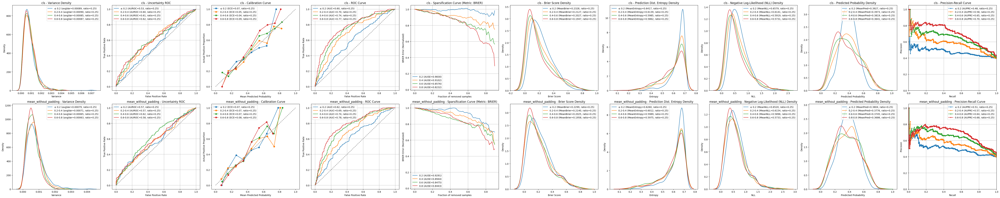

In [23]:
label_map = {"BACKGROUND": 0, "OBJECTIVE": 1}
y_val_int = np.array([label_map[lbl] for lbl in y_val_aug])
truncations=[0.2,0.4,0.6,0.8]
truncation_colors= sns.color_palette("tab10", n_colors=len(truncations))
data=model_result_show(
    res_set,
    y_val_int,
    val_trunc_levels,
    poolings,
    truncations,
    truncation_colors,
    metric='brier'
)


/tmp/ipykernel_1904883/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1904883/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1904883/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1904883/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1904883/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ne

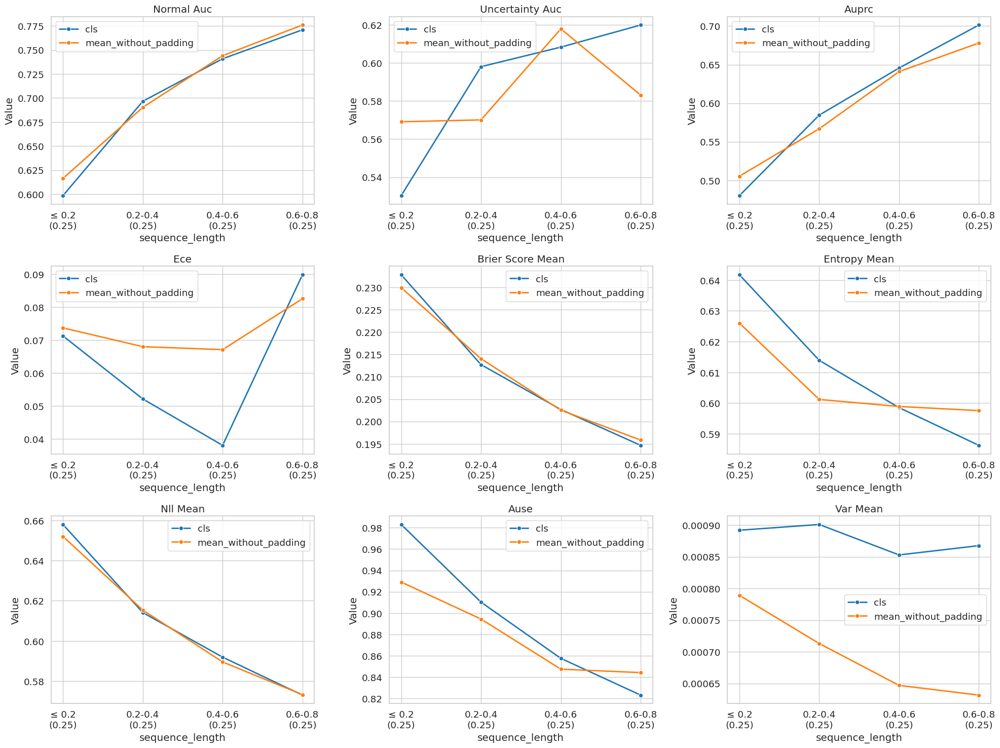

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.DataFrame(data)
truncation_ratio_dict = df.groupby('truncation')['ratio'].first().to_dict()
metrics = df.columns.to_list()[3:10] + df.columns.to_list()[11:]
df_melted = df.melt(
    id_vars=['pooling', 'truncation'],
    value_vars=metrics,
    var_name='metric',
    value_name='value'
)
sns.set(style="whitegrid", font_scale=1.2)
unique_metrics = df_melted['metric'].unique()
unique_poolings = df_melted['pooling'].unique()
palette = sns.color_palette("tab10", n_colors=len(unique_poolings))
color_dict = dict(zip(unique_poolings, palette))
num_metrics = len(unique_metrics)
num_cols = 3
num_rows = int(np.ceil(num_metrics / num_cols))
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
axes = axes.flatten()
for idx, metric in enumerate(unique_metrics):
    ax = axes[idx]
    data_metric = df_melted[df_melted['metric'] == metric]
    for pooling in unique_poolings:
        data_pooling = data_metric[data_metric['pooling'] == pooling]
        sns.lineplot(
            data=data_pooling,
            x='truncation',
            y='value',
            marker='o',
            label=pooling,
            color=color_dict[pooling],
            ax=ax,
            linewidth=2
        )
    ax.set_title(metric.replace('_', ' ').title())
    ax.set_xlabel('sequence_length')
    ax.set_ylabel('Value')
    ax.legend()
    current_ticklabels = ax.get_xticklabels()
    new_labels = []
    for lbl in current_ticklabels:
        text = lbl.get_text()
        if text in truncation_ratio_dict:
            ratio_val = truncation_ratio_dict[text]
            new_label = f"{text}\n({ratio_val:.2f})"
        else:
            new_label = text
        new_labels.append(new_label)
    ax.set_xticklabels(new_labels)
for j in range(len(unique_metrics), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()


/tmp/ipykernel_1521094/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1521094/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1521094/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1521094/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `sci

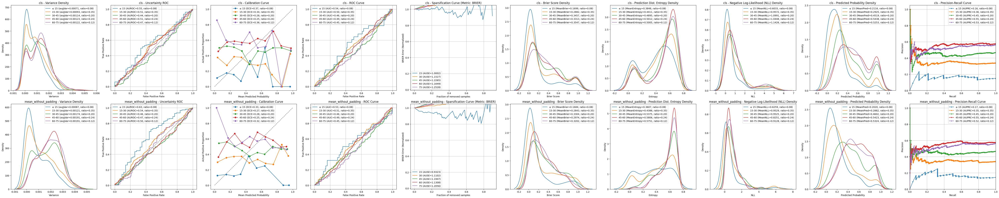

In [20]:
label_map = {"BACKGROUND": 0, "OBJECTIVE": 1}
y_val_int = np.array([label_map[lbl] for lbl in balanced_y_val])
truncations=[15,30,45,60,75]
truncation_colors= sns.color_palette("tab10", n_colors=len(truncations))
data=model_result_show(
    res_set,
    y_val_int,
    balanced_val_lengths,
    poolings,
    truncations,
    truncation_colors,
    metric='brier'
)


/tmp/ipykernel_1236262/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1236262/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1236262/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1236262/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `sci

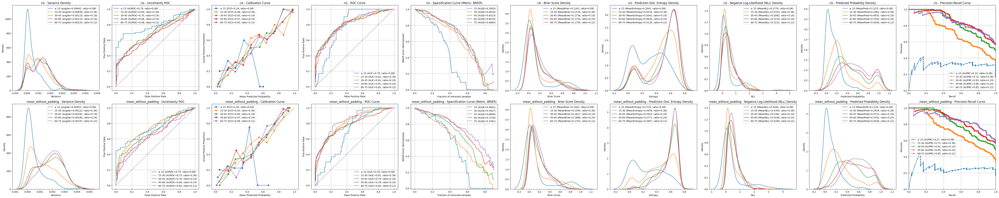

In [20]:
label_map = {"BACKGROUND": 0, "OBJECTIVE": 1}
y_val_int = np.array([label_map[lbl] for lbl in balanced_y_val])
truncations=[15,30,45,60,75]
truncation_colors= sns.color_palette("tab10", n_colors=len(truncations))
data=model_result_show(
    res_set,
    y_val_int,
    balanced_val_lengths,
    poolings,
    truncations,
    truncation_colors,
    metric='brier'
)


/tmp/ipykernel_1236262/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1236262/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1236262/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1236262/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1236262/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ne

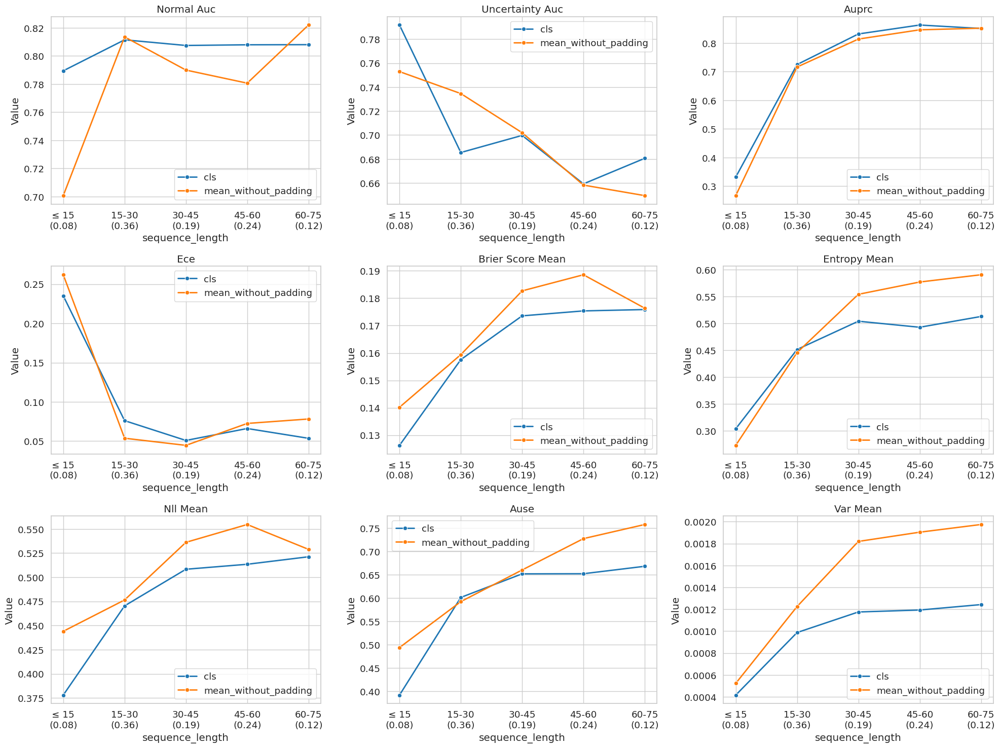

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.DataFrame(data)
truncation_ratio_dict = df.groupby('truncation')['ratio'].first().to_dict()
metrics = df.columns.to_list()[3:10] + df.columns.to_list()[11:]
df_melted = df.melt(
    id_vars=['pooling', 'truncation'],
    value_vars=metrics,
    var_name='metric',
    value_name='value'
)
sns.set(style="whitegrid", font_scale=1.2)
unique_metrics = df_melted['metric'].unique()
unique_poolings = df_melted['pooling'].unique()
palette = sns.color_palette("tab10", n_colors=len(unique_poolings))
color_dict = dict(zip(unique_poolings, palette))
num_metrics = len(unique_metrics)
num_cols = 3
num_rows = int(np.ceil(num_metrics / num_cols))
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
axes = axes.flatten()
for idx, metric in enumerate(unique_metrics):
    ax = axes[idx]
    data_metric = df_melted[df_melted['metric'] == metric]
    for pooling in unique_poolings:
        data_pooling = data_metric[data_metric['pooling'] == pooling]
        sns.lineplot(
            data=data_pooling,
            x='truncation',
            y='value',
            marker='o',
            label=pooling,
            color=color_dict[pooling],
            ax=ax,
            linewidth=2
        )
    ax.set_title(metric.replace('_', ' ').title())
    ax.set_xlabel('sequence_length')
    ax.set_ylabel('Value')
    ax.legend()
    current_ticklabels = ax.get_xticklabels()
    new_labels = []
    for lbl in current_ticklabels:
        text = lbl.get_text()
        if text in truncation_ratio_dict:
            ratio_val = truncation_ratio_dict[text]
            new_label = f"{text}\n({ratio_val:.2f})"
        else:
            new_label = text
        new_labels.append(new_label)
    ax.set_xticklabels(new_labels)
for j in range(len(unique_metrics), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()


/tmp/ipykernel_1063565/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1063565/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1063565/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_1063565/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `sci

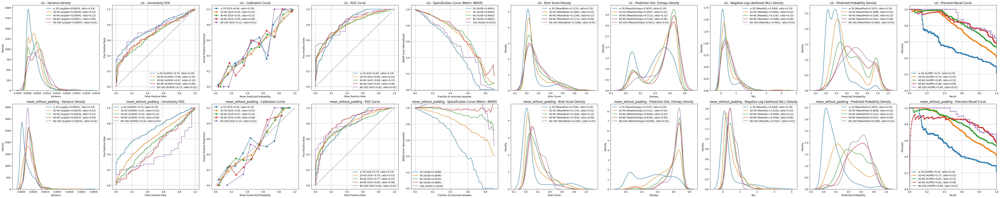

In [8]:
label_map = {"BACKGROUND": 0, "OBJECTIVE": 1}
y_val_int = np.array([label_map[lbl] for lbl in y_val])
truncations=[15,30,45,60,75]
truncation_colors= sns.color_palette("tab10", n_colors=len(truncations))
data=model_result_show(
    res_set,
    y_val_int,
    val_lengths,
    poolings,
    truncations,
    truncation_colors,
    metric='brier'
)


In [10]:
unique_metrics = df_melted['metric'].unique()


In [11]:
unique_metrics=np.narray(['var_mean','nll_mean','normal_auc', 'uncertainty_auc', 'auprc', 'ece',
       'brier_score_mean', 'entropy_mean', 'nll_mean', 'ause', 'var_mean'])


array(['normal_auc', 'uncertainty_auc', 'auprc', 'ece',
       'brier_score_mean', 'entropy_mean', 'nll_mean', 'ause', 'var_mean'],
      dtype=object)

/tmp/ipykernel_1063565/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1063565/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1063565/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1063565/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)
/tmp/ipykernel_1063565/1492530582.py:89: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ne

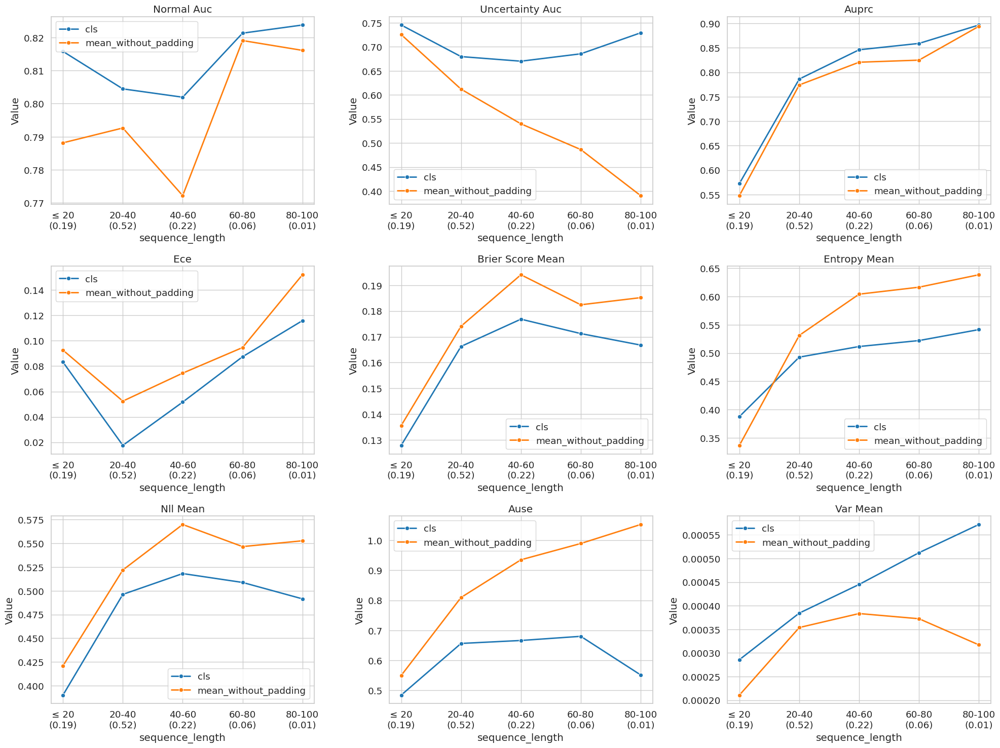

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.DataFrame(data)
truncation_ratio_dict = df.groupby('truncation')['ratio'].first().to_dict()
metrics = df.columns.to_list()[3:10] + df.columns.to_list()[11:]
df_melted = df.melt(
    id_vars=['pooling', 'truncation'],
    value_vars=metrics,
    var_name='metric',
    value_name='value'
)
sns.set(style="whitegrid", font_scale=1.2)
unique_metrics = df_melted['metric'].unique()
unique_poolings = df_melted['pooling'].unique()
palette = sns.color_palette("tab10", n_colors=len(unique_poolings))
color_dict = dict(zip(unique_poolings, palette))
num_metrics = len(unique_metrics)
num_cols = 3
num_rows = int(np.ceil(num_metrics / num_cols))
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
axes = axes.flatten()
for idx, metric in enumerate(unique_metrics):
    ax = axes[idx]
    data_metric = df_melted[df_melted['metric'] == metric]
    for pooling in unique_poolings:
        data_pooling = data_metric[data_metric['pooling'] == pooling]
        sns.lineplot(
            data=data_pooling,
            x='truncation',
            y='value',
            marker='o',
            label=pooling,
            color=color_dict[pooling],
            ax=ax,
            linewidth=2
        )
    ax.set_title(metric.replace('_', ' ').title())
    ax.set_xlabel('sequence_length')
    ax.set_ylabel('Value')
    ax.legend()
    current_ticklabels = ax.get_xticklabels()
    new_labels = []
    for lbl in current_ticklabels:
        text = lbl.get_text()
        if text in truncation_ratio_dict:
            ratio_val = truncation_ratio_dict[text]
            new_label = f"{text}\n({ratio_val:.2f})"
        else:
            new_label = text
        new_labels.append(new_label)
    ax.set_xticklabels(new_labels)
for j in range(len(unique_metrics), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()


## Truncation exper

/tmp/ipykernel_642008/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_642008/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_642008/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  ause_pred = np.trapz(y=uncertainty_scores_normalized, x=fractions) / (max_fraction - min_fraction)
/tmp/ipykernel_642008/2474444826.py:166: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.i

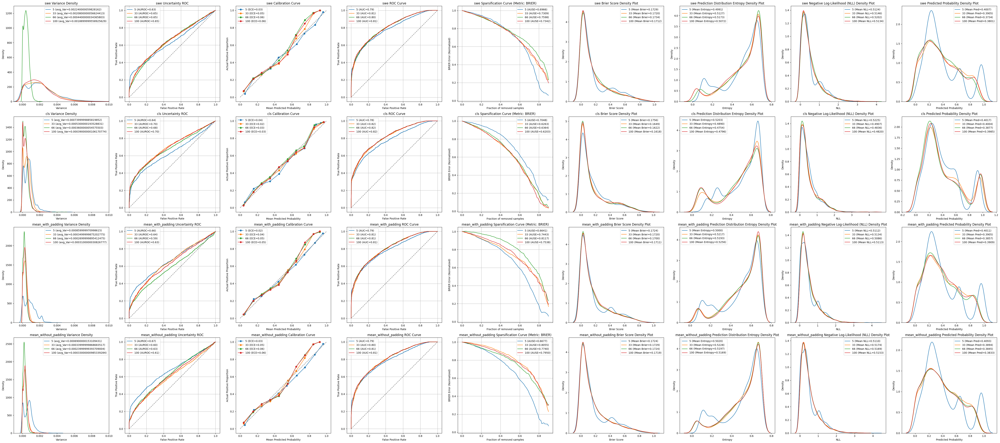

In [10]:
label_map = {"BACKGROUND": 0, "OBJECTIVE": 1}
y_val_int = np.array([label_map[lbl] for lbl in y_val])
truncation_colors= sns.color_palette("tab10", n_colors=len(truncations))
data=model_result_show(res_set,y_val_int,poolings,truncations,truncation_colors,metric="brier")


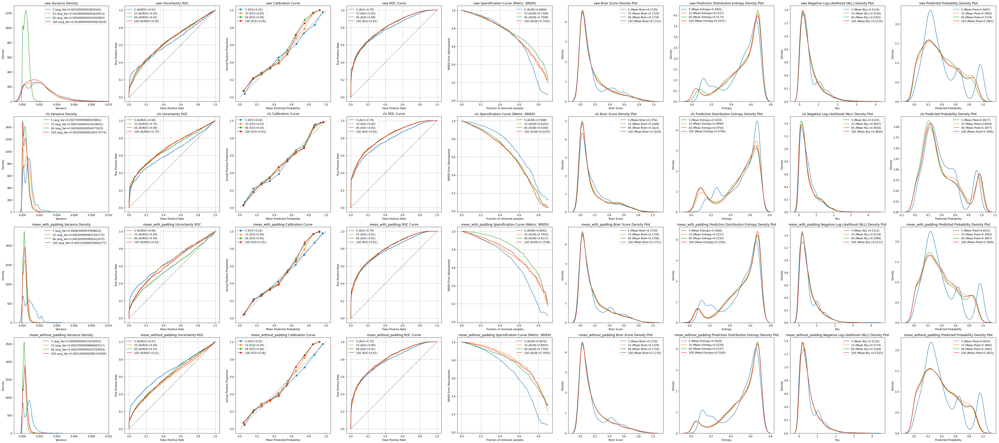

In [53]:
truncation_colors= sns.color_palette("tab10", n_colors=len(truncations))
data=model_result_show(res_set,y_val_int,poolings,truncations,truncation_colors,metric="brier")


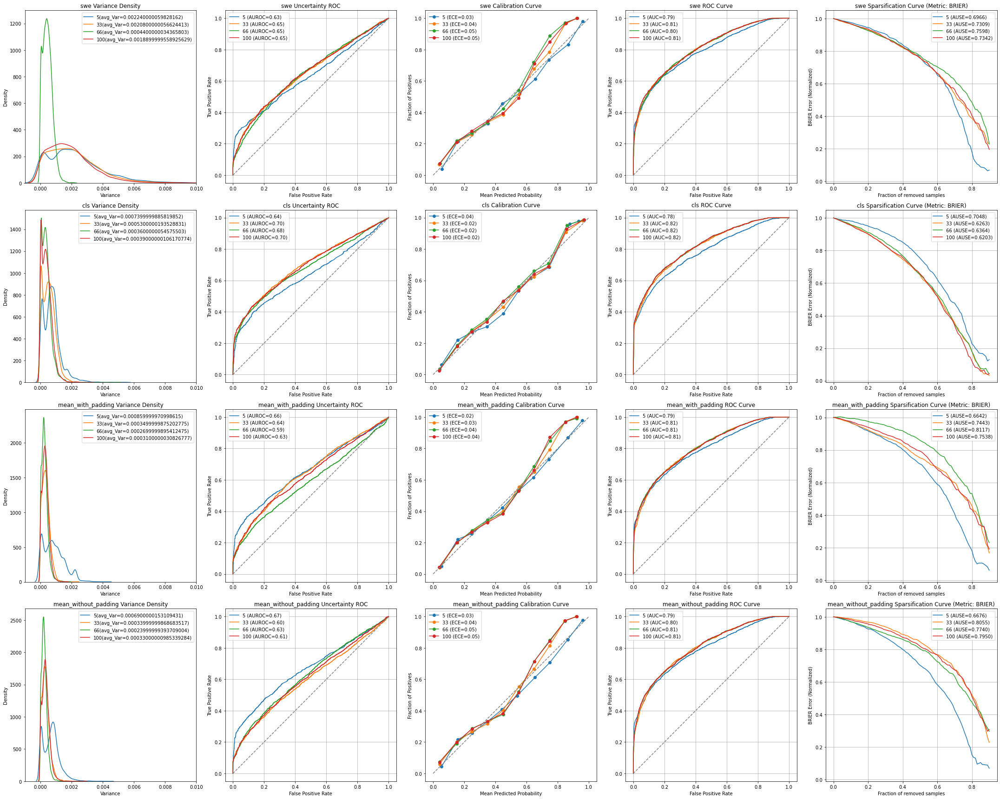

,pooling,truncation,normal_auc,uncertainty_auc,auprc,ece,brier_score,ause
0,swe,5,0.787530,0.631268,0.768636,0.028625,0.172914,0.696558
1,swe,33,0.805425,0.649062,0.777522,0.039830,0.172017,0.730894
2,swe,66,0.804457,0.645965,0.775542,0.045168,0.173417,0.759821
3,swe,100,0.806509,0.649573,0.782045,0.050413,0.171228,0.734231
4,cls,5,0.780503,0.637277,0.762465,0.037152,0.175626,0.704804
5,cls,33,0.815434,0.698320,0.790256,0.019554,0.164910,0.626321
6,cls,66,0.820039,0.681666,0.796361,0.023160,0.162249,0.636394
7,cls,100,0.820235,0.695231,0.796753,0.020310,0.161774,0.620269
8,mean_with_padding,5,0.788884,0.660914,0.769939,0.021825,0.172372,0.664203
9,mean_with_padding,33,0.805839,0.644563,0.775852,0.031238,0.171953,0.744298


In [20]:
model_result_show(res_set,y_val_int,poolings,truncations)


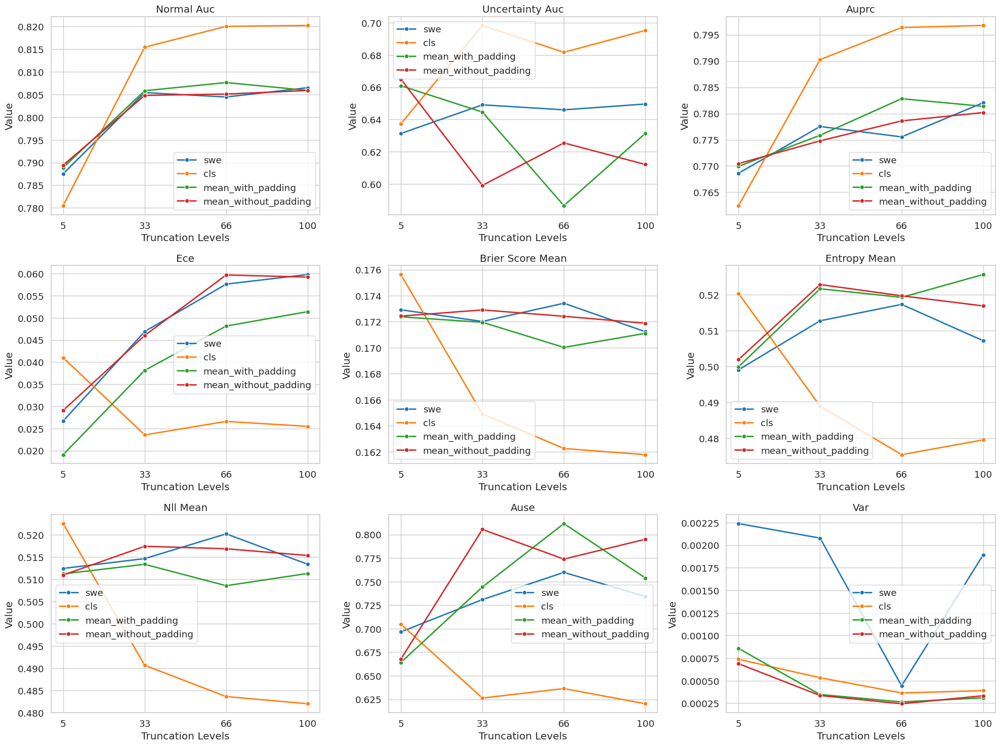

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.DataFrame(data)
truncation_order = ["5", "33", "66", "100"]
df['truncation'] = pd.Categorical(df['truncation'], categories=truncation_order, ordered=True)
metrics = ['normal_auc', 'uncertainty_auc', 'auprc', 'ece',
           'brier_score_mean', 'entropy_mean', 'nll_mean',
            'ause',"var"]
df_melted = df.melt(id_vars=['pooling', 'truncation'],
                    value_vars=metrics,
                    var_name='metric',
                    value_name='value')
sns.set(style="whitegrid", font_scale=1.2)
unique_metrics = df_melted['metric'].unique()
unique_poolings = df_melted['pooling'].unique()
palette = sns.color_palette("tab10", n_colors=len(unique_poolings))
color_dict = dict(zip(unique_poolings, palette))
num_metrics = len(unique_metrics)
num_cols = 3
num_rows = int(np.ceil(num_metrics / num_cols))
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
axes = axes.flatten()
for idx, metric in enumerate(unique_metrics):
    ax = axes[idx]
    data_metric = df_melted[df_melted['metric'] == metric]
    for pooling in unique_poolings:
        data_pooling = data_metric[data_metric['pooling'] == pooling]
        sns.lineplot(data=data_pooling, x='truncation', y='value',
                     marker='o', label=pooling, color=color_dict[pooling], ax=ax, linewidth=2)
    ax.set_title(metric.replace('_', ' ').title())
    ax.set_xlabel('Truncation Levels')
    ax.set_ylabel('Value')
    ax.legend()
plt.tight_layout()
plt.show()


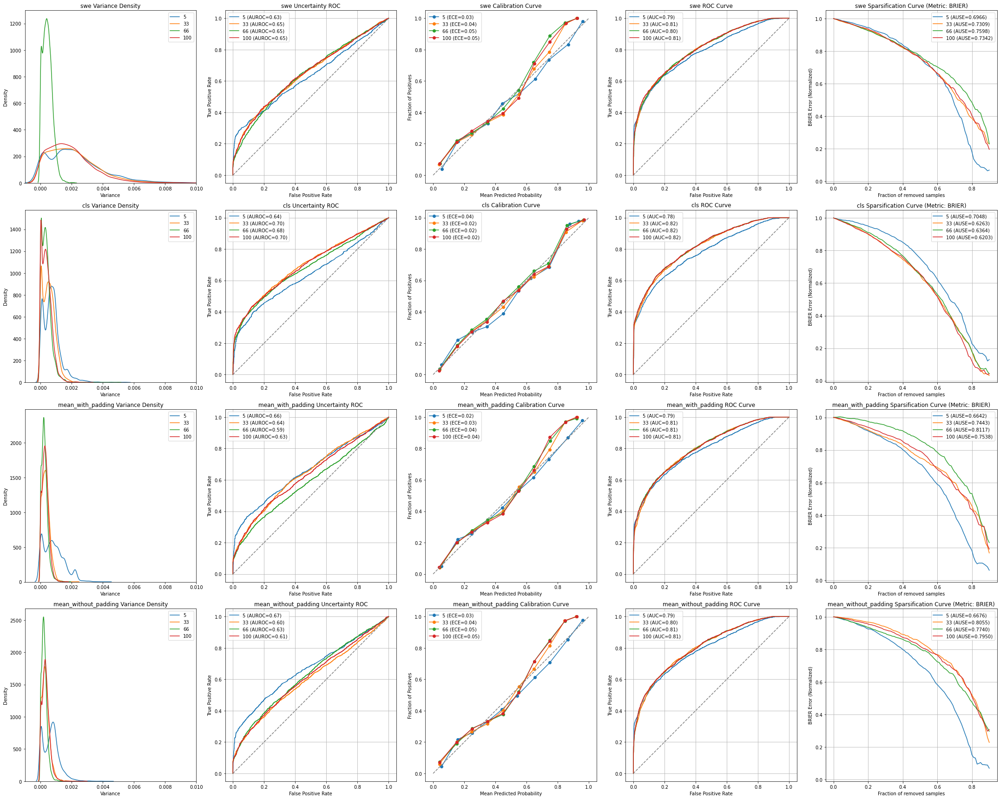

,pooling,truncation,normal_auc,uncertainty_auc,auprc,ece,brier_score,ause
0,swe,5,0.787530,0.631268,0.768636,0.028625,0.172914,0.696558
1,swe,33,0.805425,0.649062,0.777522,0.039830,0.172017,0.730894
2,swe,66,0.804457,0.645965,0.775542,0.045168,0.173417,0.759821
3,swe,100,0.806509,0.649573,0.782045,0.050413,0.171228,0.734231
4,cls,5,0.780503,0.637277,0.762465,0.037152,0.175626,0.704804
5,cls,33,0.815434,0.698320,0.790256,0.019554,0.164910,0.626321
6,cls,66,0.820039,0.681666,0.796361,0.023160,0.162249,0.636394
7,cls,100,0.820235,0.695231,0.796753,0.020310,0.161774,0.620269
8,mean_with_padding,5,0.788884,0.660914,0.769939,0.021825,0.172372,0.664203
9,mean_with_padding,33,0.805839,0.644563,0.775852,0.031238,0.171953,0.744298


In [67]:
model_result_show(res_set,y_val_int,poolings,truncations)
